1) Format Date in Excel

2) Cut to .csv

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import datetime as dt
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import time
from datetime import datetime, date
from tabulate import tabulate
from os import listdir
from os.path import isfile, join

3) Create simple, raw plots

In [2]:
collection_date ='2021-03-02'
collection_date_list = {
    '2020-04-05':{
        'probe':'old',
        'transects':[0,1,2,3,4,5]
    },
    '2020-04-17':{
        'probe':'old',
        'transects':[0,1,2,3,4,5]
    },
    '2020-06-01':{
        'probe':'new',
        'transects':[0,1,2,3,4,5]
    },
    '2020-06-13':{
        'probe':'new',
        'transects':[0,1,2,3,4,5]
    },
    '2020-06-18':{
        'probe':'new',
        'transects':[0,1,2,3,4,5]
    },
    '2020-07-01':{
        'probe':'new',
        'transects':[0,2,3,4,6,7]
    },
    '2020-07-07':{
        'probe':'new',
        'transects':[0,2,3,4,6,7]
    },
    '2020-07-18':{
        'probe':'old',
        'transects':[0,2,3,4,6,7]
    },
    '2020-09-05':{
        'probe':'old',
        'transects':[0,2,3,4,6,7]
    },
    '2020-09-13':{
        'probe':'old',
        'transects':[0,2,3,4,6]
    },
    '2020-09-14':{
        'probe':'old',
        'transects':[0,2,3,4,5,6]
    },
    '2020-09-22':{
        'probe':'old',
        'transects':[0,2,3,4,6,7]
    },
    '2020-09-30':{
        'probe':'old',
        'transects':[0,1,2,3,4,6,7]
    },
    '2020-10-10':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2020-10-21':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2020-11-02':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2020-11-08':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2020-12-03':{
        'probe':'old',
        'transects':[0,1,2,4,5,6,7]
    },
    '2020-12-04':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2021-01-05':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2021-02-09':{
        'probe':'old',
        'transects':[0,1,2,3,4,5,6,7]
    },
    '2021-03-02':{
        'probe':'old',
        'transects':[0,2,4,6,8,10,12]
    },
}

In [3]:
def load_windy(collection_date):
        windy = pd.read_excel('/Users/bkszanth0/Dropbox/windy/windy_morocco_in.xlsx', columns=[])
        ind_list = windy.index[windy['date/time']==collection_date].to_list()
        week_up = windy.loc[ind_list[0]-7:ind_list[0], :]
        week_up.to_csv('windy_export_{}.csv'.format(collection_date))

In [4]:
load_windy(collection_date)

TypeError: read_excel() got an unexpected keyword argument 'columns'

In [5]:
def inditide(collection_date):
    #confirmed - works
    
    def MS_content_scraper():
        login_url = 'https://magicseaweed.com/account/login/?dest=%2F'
        url_of_interest = 'https://magicseaweed.com/Tarfaya-Surf-Report/3128/Historic/?start={}&end={}'.format(collection_date,collection_date)
        browser = webdriver.Chrome(executable_path= "/usr/local/bin/chromedriver")
        browser.get(login_url)
        time.sleep(2)
        inputEmail = browser.find_element_by_xpath('//*[@id="msw-js-user-login-tab"]/form/div[2]/input')
        inputEmail.send_keys('raffael_jovine@yahoo.co.uk')
        time.sleep(1)
        inputPW = browser.find_element_by_xpath('/html/body/div[1]/div/div/div/div/div/div[1]/form/div[3]/input')
        inputPW.send_keys('Akhfennir123')
        time.sleep(1)
        browser.find_element_by_xpath('//*[@id="msw-js-login"]').click()
        time.sleep(3)
        try:
            browser.get(url_of_interest)
            time.sleep(3)
            content = browser.page_source
            time.sleep(2)
        except:
            pass            
        browser.close()
        return content
    content = MS_content_scraper()
    soup = BeautifulSoup(content, parser='html')
    tbody = soup.find_all("tbody")
    tides = tbody[1].get_text()
    tide_list = [s for s in tides.split(' ') if s != ''] 
    return tide_list

In [6]:
inditide = inditide(collection_date)

In [7]:
def create_tide_df(inditide_output, date):
    
    # create tide df depending on the number of values available
    # works - confirmed
    if len(inditide_output)== 18:
        df = pd.DataFrame(
            data= [inditide_output[0:3],inditide_output[3:6],inditide_output[6:9],inditide_output[9:12], inditide_output[12:15],inditide_output[15:18]],
            columns=['type','time','height']
        )
    else:
        df = pd.DataFrame(
            data= [inditide_output[0:3],inditide_output[3:6],inditide_output[6:9],inditide_output[12:15]], 
            columns=['type','time','height']
        )    
        
    #datetime formatting    
    #works - confirmed
    df['time']=date+' '+df['time']
    df['time']=pd.to_datetime(df['time'])
    df['time'] = [time.time() for time in df['time']]
    return df



def tide_calc(tidetable, sampling_time):
    #works - confirmed
    sampling_time = pd.to_datetime(sampling_time)
    sampling_time = sampling_time.time()    
    
def core(table_row1, table_row2):
    doi = tidetable.loc[[table_row1, table_row2], :]   
        
        
    interval = datetime.combine(date.today(), doi['time'][table_row2]) - datetime.combine(date.today(), doi['time'][table_row1])
    interval_eighth = interval/8
    list_of_eighths = [
        datetime.combine(date.today(), doi['time'][table_row1]),
        datetime.combine(date.today(), doi['time'][table_row1])+1*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+2*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+3*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+4*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+5*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+6*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+7*interval_eighth,
        datetime.combine(date.today(), doi['time'][table_row1])+8*interval_eighth   
        ]
    tide1 = float(doi['height'][table_row2][:-1])
    tide0 = float(doi['height'][table_row1][:-1])
    delta_tide = tide1 - tide0
    tide_16th = delta_tide/16
        
    #where in the list_of_sixths are we? -> how to apply rule of 12th
    n=0
    for i in list_of_eigths:
        if datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), i.time()):
            t1 = i.time()
            t0 = list_of_eighths[n-1].time()   
            break
        else:
            n=n+1
        if (n==1):
            finish_tide = tide0 + 1*tide_16th 
            start_tide = tide0
        elif (n==2):
            finish_tide = tide0 + 3*tide_16th 
            start_tide = tide0 + 1*tide_16th
        elif (n==3):
            finish_tide = tide0 + 6*tide_16th 
            start_tide = tide0 + 3*tide_16th 
        elif (n==4):
            finish_tide = tide0 + 9*tide_16th 
            start_tide = tide0 + 6*tide_16th    
        elif (n==5):
            finish_tide = tide0 + 11*tide_16th 
            start_tide = tide0 + 9*tide_16th 
        elif (n==6):
            finish_tide = tide0 + 12*tide_16th 
            start_tide = tide0 + 11*tide_16th
        elif (n==7):
            finish_tide = tide0 + 13*tide_16th 
            start_tide = tide0 + 15*tide_16th
        elif (n==8):
            finish_tide = tide0 + 15*tide_16th 
            start_tide = tide0 + 17*tide_16th

        x = ((datetime.combine(date.today(), sampling_time)-(datetime.combine(date.today(), t0))))/((datetime.combine(date.today(), t1)-(datetime.combine(date.today(), t0))))
        actual_tide = start_tide+(finish_tide - start_tide)*x        
        return actual_tide

    try:
        if datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][0]):
            print('suspiciously early sampling')
        elif datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][1]):
            return core(0,1)
        elif datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][2]):
            return core(1,2)
        elif datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][3]):
            return core(2,3)
        else:
            print('suspiciously late sampling')
    except KeyError:
        if datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][0]):
            print('suspiciously early sampling')
        elif datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][1]):
            return core(0,1)
        elif datetime.combine(date.today(), sampling_time) <= datetime.combine(date.today(), tidetable['time'][2]):
            return core(1,2)
        else:
            print('suspiciously late sampling')
            
def get_sampling_time(file):
    #works - confirmed
    
    df = pd.read_csv(file)
    df['Date & Time'] = pd.to_datetime(df['Date & Time'])
    sampling_time = min(df['Date & Time'])
    return sampling_time

In [8]:
def tide_corrector(date, f):
    #update 2020-07-18
    #no list of files included
        
    #generate tidetable
    t = inditide
    tides = create_tide_df(t, date)
    
    #calculate tide, export df
    x = tide_calc(tides, get_sampling_time(i))
    print(tides)
    print(i, 'sampling time: ', get_sampling_time(i), 'actual tide: ', x)
    corrected_df = pd.read_csv(f)
    corrected_df['Tide Corrected Depth (m)'] = corrected_df['Depth (m)'] - x
    corrected_df.to_csv('../aquaread_transects/TideCorrected_AquaRead_{}_{}.csv'.format(date, f[-5]))

In [9]:
params_attr = {
    'Temp (C)':{
        'color':'#4d8cab',
        'lim1':14,
        'lim2':24,
        'label':'Temperature (°C)'
    },
    'pH':{        
        'color':'#619184',
        'lim1':7,
        'lim2':10,
        'label':'pH'
    },
    'DO (% Sat)':{        
        'color':'#c9614f',
        'lim1':0,
        'lim2':160,
        'label':'DO (% Sat)'
    },
    'DO (mg/L)':{        
        'color':'#f0a46e',
        'lim1':0,
        'lim2':15,
        'label':'DO (mg/L)'
    },    
    'Chlorophyll (ug/L)':{        
        'color':'#38823a',
        'lim1':-10,
        'lim2':300,
        'label':r'Chlorophyll $\mathregular{(\frac{\mu g}{L})}$'
    },
    'Turbidity (NTU)':{        
        'color':'#383882',
        'lim1':-30,
        'lim2':200,
        'label':'Turbidity (NTU)'
    },
    'EC (uS/cm @25C)':{        
        'color':'#e6c73e',
        'lim1':53000,
        'lim2':58000,
        'label':r'EC (uS/cm @25C)',
        'label':r'EC $\mathregular{(\frac{\mu S}{cm})}$ @25°C'
    },
    'DIC_uM':{
        'color':'#37516b',
        'lim1':1600,
        'lim2':1800,
        'label':r'DIC $\mathregular{({\mu M})}$'
    },
    'HCO3_uM':{
        'color':'#6b375b',
        'lim1':1500,
        'lim2':2000,
        'label':u'HCO\u2083\u207B $\mathregular{({\mu M})}$'
    },
    'CO3_uM':{
        'color':'#ad313b',
        'lim1':50,
        'lim2':150,
        'label':u'CO\u2083\u00B2\u207B $\mathregular{({\mu M})}$'
    },
    'CO2_uM':{
        'color':'#68823e',
        'lim1':0,
        'lim2':50,
        'label':u'CO\u2082 $\mathregular{({\mu M})}$'
    },
    'pCO2_uatm':{
        'color':'#cc7931',
        'lim1':400,
        'lim2':1000,
        'label':u'pCO\u2082 $\mathregular{({\mu atm})}$'
    }
}

In [10]:
def plot_all8(input_file, 
              collection_date,
              old_probe=False,
              plot_export=False,
              tidecor = False
             ):
    
    
    #version update 2020-08-03
    #load windy separate
    #tidecalc separate
    #tidecor option included
    
    
    #select input file (required format: UTF-8 encoded .csv; representing 1 transect only)
    tr = pd.read_csv(input_file)  
    
    #this section gets rid of the 'upcoming' part of the data 
    depth_max = tr['Depth (m)'].max()
    tr_cut_point = tr.loc[tr['Depth (m)']==depth_max, :].index[0]
    tr_cut = tr.loc[:tr_cut_point, :]
    
    if tidecor == False:
        depth = tr_cut['Depth (m)']
        depth_ud = tr['Depth (m)']
        
        dlim1 = -26
        dlim2 = 0
        
    else:
        depth = tr_cut['Tide Corrected Depth (m)']
        depth_ud = tr['Tide Corrected Depth (m)']
        
        dlim1 = -26
        dlim2 = 5
        
    #defining datasets    ---- maybe delete?????????????????????????
    temp = tr_cut['Temp (C)']
    do = tr_cut['DO (% Sat)']
    ph = tr_cut['pH']
    ec = tr_cut['EC (uS/cm @25C)']
    do_mgl = tr_cut['DO (mg/L)']    
    temp_ud = tr['Temp (C)']
    do_ud = tr['DO (% Sat)']
    ph_ud = tr['pH']
    ec_ud = tr['EC (uS/cm @25C)']
    do_mgl_ud = tr['DO (mg/L)']
    
    if old_probe==True:
        turb = tr_cut['Turbidity (NTU)']
        chloro = tr_cut['Chlorophyll (ug/L)']
        turb_ud = tr['Turbidity (NTU)']
        chloro_ud = tr['Chlorophyll (ug/L)']
    
    #creating figure and sublplots, naming
    if old_probe == True:
        fig, axes = plt.subplots(9, 2, sharey=True)
        fig.set_size_inches(12.8, 48)

    else:
        fig, axes = plt.subplots(7, 2, sharey=True)
        fig.set_size_inches(12.8, 33.6)
    
    #naming
    if (input_file[-5] == '0') or (input_file[-5] == '1'):
        fig.suptitle(input_file+' - Near Shore', x=0.5, y=0.998, fontsize=13)
    elif (input_file[-5] == '2') or (input_file[-5] == '3'):
        fig.suptitle(input_file+' - Mid Shore AQ2', x=0.5, y=0.998, fontsize=13)
    elif (input_file[-5] == '4') or (input_file[-5] == '5'):
        fig.suptitle(input_file+' - Off Shore', x=0.5, y=0.998, fontsize=13) 
    elif (input_file[-5] == '6') or (input_file[-5] == '7'):
        fig.suptitle(input_file+' - Mid Shore AQ4', x=0.5, y=0.998, fontsize=13)
    elif (input_file[-5] == '8') or (input_file[-5] == '9'):
        fig.suptitle(input_file+' - Mid Shore AQ5', x=0.5, y=0.998, fontsize=13)
    elif (input_file[-5] == '10') or (input_file[-5] == '11'):
        fig.suptitle(input_file+' - Mid Shore AQ6', x=0.5, y=0.998, fontsize=13)
    elif (input_file[-5] == '12') or (input_file[-5] == '13'):
        fig.suptitle(input_file+' - Mid Shore AQ7', x=0.5, y=0.998, fontsize=13)
    
    #timecalc
    def time_calc(input_file):
        tr = pd.read_csv(input_file)
        
        time = tr['Date & Time'].str.split(' ', expand=True)
        tr['Time'] = time[1]
        tr['Time'] = pd.to_datetime(tr['Time'])
        tr['Time'] = [time.time() for time in tr['Time']]
        start_time, end_time = min(tr['Time']), max(tr['Time'])
        depth_max = tr['Depth (m)'].max()
        max_ser = tr.loc[tr['Depth (m)']==depth_max, 'Time']
        bottom_time = max_ser.iloc[0]
        total_sampling_time = datetime.combine(date.today(), end_time) - datetime.combine(date.today(), start_time)
        down_time = datetime.combine(date.today(), bottom_time) - datetime.combine(date.today(), start_time)
        up_time = datetime.combine(date.today(), end_time) - datetime.combine(date.today(), bottom_time)    
        down_depth = tr.loc[0,'Depth (m)'] - depth_max
        up_depth = tr.iloc[-1, 5] - depth_max
                
        times = """start time: {}
        \nend time: {}
        \nbottom time: {}
        \ntotal sampling time: {}
        \ndown (s): {}
        \nup (s): {}
        \ndown (m): {}
        \nup (m): {}
        \ndown sampling speed (s/m): {}
        \nup sampling speed (s/m): {}""".format(start_time, 
                                                end_time,
                                                bottom_time,
                                                total_sampling_time,
                                                down_time.seconds,
                                                up_time.seconds,
                                                down_depth,
                                                up_depth,
                                                -down_time.seconds/down_depth,
                                                -up_time.seconds/up_depth)    
        
        fig.text(0.05, 0.90, times, fontsize=10)
    
    time_calc(input_file)
    
    #present tide on top
    fig.text(0.60,  0.90, 'Tide'+'\n'+tabulate([inditide[0:3],inditide[3:6],inditide[6:9],inditide[9:12]]),fontsize=10)
        
    #creating simple plots
    def simple_p(loc_r, loc_c, pstr, up=False):
        ax = axes[loc_r, loc_c]
        if up==False:
            ax.plot(tr_cut[pstr], -depth, label=params_attr[pstr]['label'], c=params_attr[pstr]['color'])
            ax.set_title(pstr+' - Down')
        else:
            ax.plot(tr[pstr], -depth_ud, label=params_attr[pstr]['label'], c=params_attr[pstr]['color'])
            ax.set_title(pstr+' - Down & Up')
        ax.set_ylabel('Depth (m)')
        ax.set_xlabel(params_attr[pstr]['label'], color=params_attr[pstr]['color'])
        ax.set_ylim(dlim1,dlim2)
        ax.set_xlim(params_attr[pstr]['lim1'], params_attr[pstr]['lim2'])
        ax.set_axisbelow(True)
        ax.grid(linestyle='-', linewidth='0.5', color='grey')
        ax.set_axisbelow(True)
        ax.minorticks_on()
        ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')  
    
    
    if old_probe ==True:
        simple_p(2,0,'Temp (C)')
        simple_p(3,0,'DO (% Sat)')
        simple_p(4,0,'DO (mg/L)')
        simple_p(5,0,'Chlorophyll (ug/L)')
        simple_p(6,0,'Turbidity (NTU)')
        simple_p(7,0,'pH')
        simple_p(8,0,'EC (uS/cm @25C)')

        simple_p(2,1,'Temp (C)',up=True)
        simple_p(3,1,'DO (% Sat)',up=True)
        simple_p(4,1,'DO (mg/L)',up=True)
        simple_p(5,1,'Chlorophyll (ug/L)',up=True)
        simple_p(6,1,'Turbidity (NTU)',up=True)
        simple_p(7,1,'pH',up=True)
        simple_p(8,1,'EC (uS/cm @25C)',up=True)
    else:
        simple_p(2,0,'Temp (C)')
        simple_p(3,0,'DO (% Sat)')
        simple_p(4,0,'DO (mg/L)')
        simple_p(5,0,'pH', '#53868B')
        simple_p(6,0,'EC (uS/cm @25C)')

        simple_p(2,1,'Temp (C)',up=True)
        simple_p(3,1,'DO (% Sat)',up=True)
        simple_p(4,1,'DO (mg/L)',up=True)
        simple_p(5,1,'pH',up=True)
        simple_p(6,1,'EC (uS/cm @25C)',up=True)
    
    #creating multiplots, adding axes
    def add_xaxis(where_to_add, pstr, how_low, up=False, ph=False):
        new_axis = where_to_add.twiny()
        if ph==False:
            new_axis.xaxis.set_ticks_position("bottom")
            new_axis.xaxis.set_label_position("bottom")
            new_axis.spines["bottom"].set_position(("axes", how_low)) 
        else:
            new_axis.xaxis.set_ticks_position("top")
            new_axis.xaxis.set_label_position("top")   
        if up==False:
            new_axis.plot(tr_cut[pstr], -depth, color=params_attr[pstr]['color'], label=params_attr[pstr]['label'])
        else:
            new_axis.plot(tr_cut[pstr], -depth, color=params_attr[pstr]['color'], label=params_attr[pstr]['label'])
        new_axis.set_xlabel(params_attr[pstr]['label'], c=params_attr[pstr]['color'])
        new_axis.set_xlim(params_attr[pstr]['lim1'],params_attr[pstr]['lim2'])     
            
    ax1 = axes[1,0]
    ax1.plot(tr_cut['Temp (C)'], -depth, label=params_attr['Temp (C)']['label'], c=params_attr['Temp (C)']['color'])
    ax1.set_xlabel(params_attr['Temp (C)']['label'], c=params_attr['Temp (C)']['color'])
    ax1.set_ylabel('Depth (m)')
    ax1.set_ylim(dlim1,dlim2)
    ax1.set_xlim(params_attr['Temp (C)']['lim1'],params_attr['Temp (C)']['lim2'])
    ax1.set_axisbelow(True)
    ax1.grid(linestyle='-', linewidth='0.5', color='grey')
    ax1.set_axisbelow(True)
    ax1.minorticks_on()
    ax1.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    ax1.set_title('All - Down')

    ax2 = axes[1,1]
    ax2.plot(tr['Temp (C)'], -depth_ud, label=params_attr['Temp (C)']['label'], c=params_attr['Temp (C)']['color'])
    ax2.set_xlabel(params_attr['Temp (C)']['label'], c=params_attr['Temp (C)']['color'])
    ax2.set_ylabel('Depth (m)')
    ax2.set_ylim(dlim1,dlim2)
    ax2.set_xlim(params_attr['Temp (C)']['lim1'],params_attr['Temp (C)']['lim2'])
    ax2.set_axisbelow(True)
    ax2.grid(linestyle='-', linewidth='0.5', color='grey')
    ax2.set_axisbelow(True)
    ax2.minorticks_on()
    ax2.grid(which='minor', linestyle=':', linewidth='0.5', color='black')    
    ax2.set_title('All - Down & Up')     
    
    if old_probe==True:
        add_xaxis(ax1, 'DO (% Sat)',-0.15)
        add_xaxis(ax1, 'pH',-0.30,ph=True)  
        add_xaxis(ax2, 'DO (% Sat)',-0.15,up=True)
        add_xaxis(ax2, 'pH',-0.30,ph=True,up=True)          
        add_xaxis(ax1, 'Chlorophyll (ug/L)',-0.30)
        add_xaxis(ax1, 'Turbidity (NTU)',-0.45)
        add_xaxis(ax2, 'Chlorophyll (ug/L)',-0.30,up=True)
        add_xaxis(ax2, 'Turbidity (NTU)',-0.45,up=True) 
    else:
        add_xaxis(ax1, 'DO (% Sat)',-0.15)
        add_xaxis(ax1, 'pH',-0.30,ph=True)  
        add_xaxis(ax2, 'DO (% Sat)',-0.15,up=True)
        add_xaxis(ax2, 'pH','#53868B',ph=True,up=True) 
    
    axes[0,0].axis('off')
    axes[0,1].axis('off')
    
    #save and show
    plt.tight_layout()
    plt.show()
    if plot_export==True:
        fig.savefig('{}_plot.png'.format(input_file[:-4]), bbox_inches='tight', dpi=200)

In [11]:
def lookup_file_list(
    mypath, 
    collection_date, 
    tidecor=False, 
    calc=False
):
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    targets = []
    for i in onlyfiles:
        if (i[-16:-6] == collection_date) and (i[-4:]=='.csv'):
            if (tidecor == True) and (i[0:4]=='Tide'):
                targets.append(join(mypath,i))
            elif (calc == True) and (i[0:4]=='calc'):
                targets.append(join(mypath,i))
            elif (tidecor != True) and (calc != True):
                if (i[0:4]!='Tide') and (i[0:4]!='calc'):
                    targets.append(join(mypath,i))
    return targets

In [14]:
lookup_file_list('../aquaread_transects', collection_date, tidecor=False)

['../aquaread_transects/AquaRead_2021-03-02_8.csv',
 '../aquaread_transects/AquaRead_2021-03-02_4.csv',
 '../aquaread_transects/AquaRead_2021-03-02_6.csv',
 '../aquaread_transects/AquaRead_2021-03-02_2.csv',
 '../aquaread_transects/AquaRead_2021-03-02_0.csv']

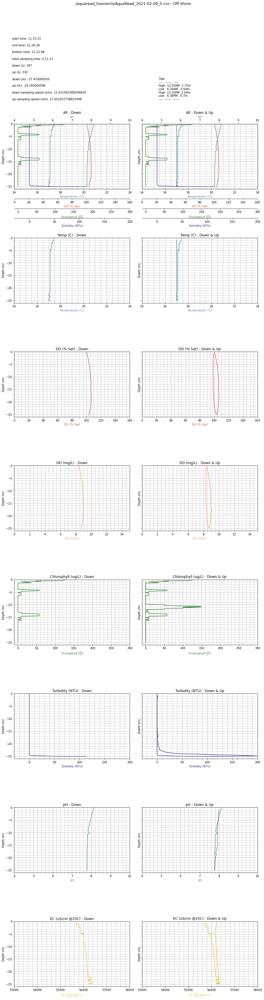

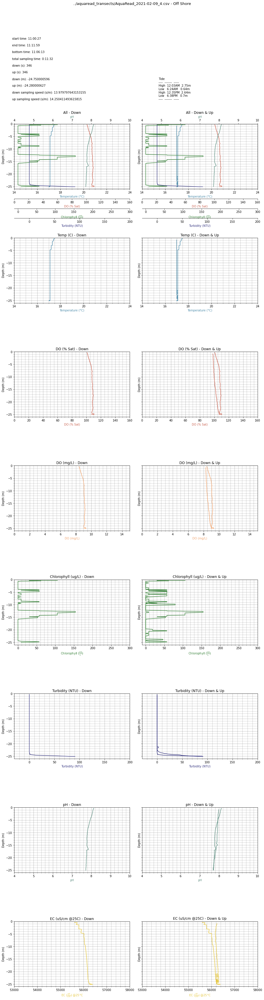

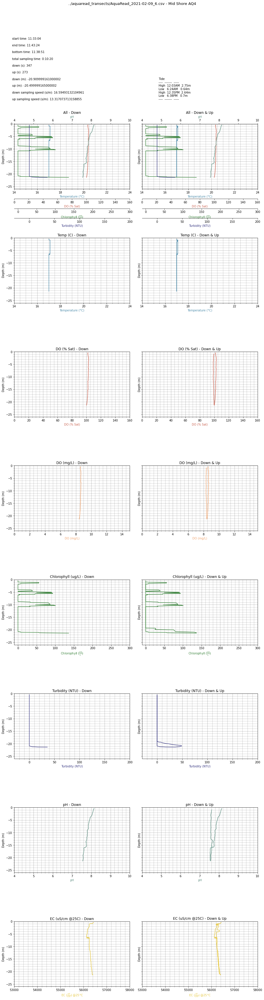

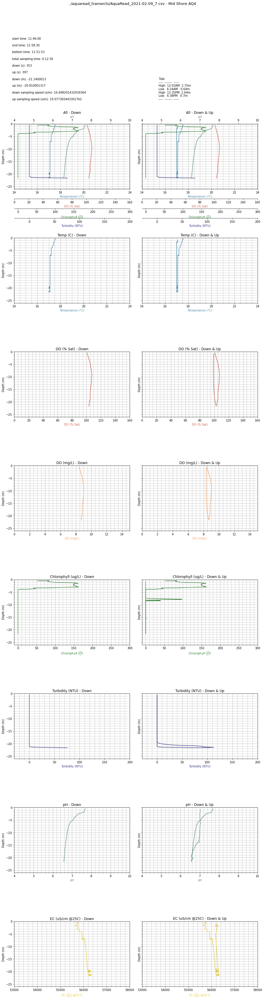

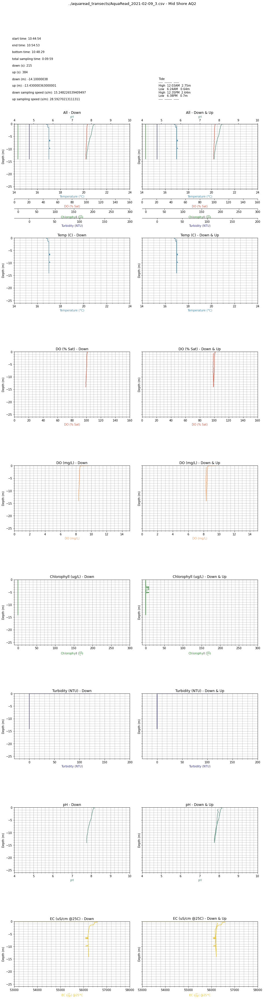

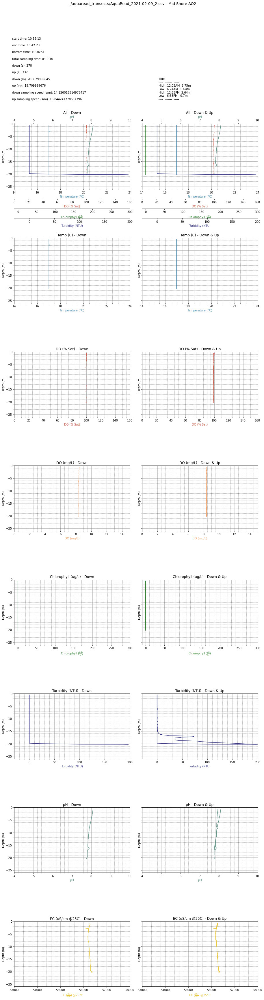

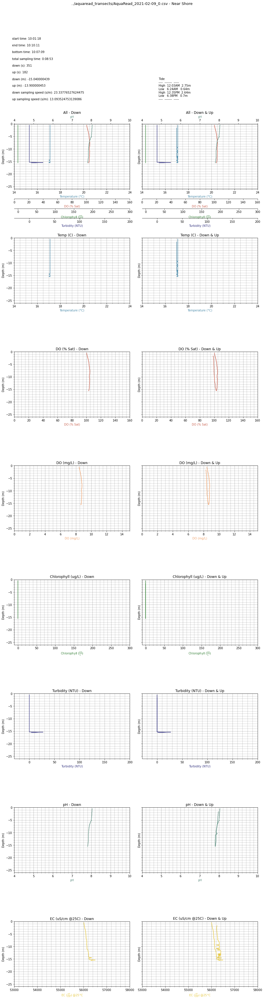

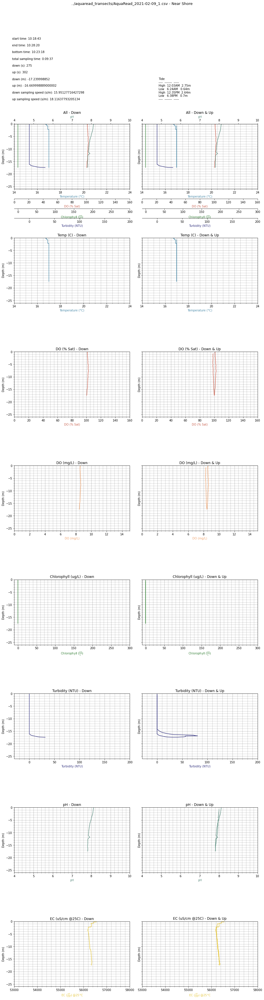

In [15]:
for i in lookup_file_list(
    "../aquaread_transects", 
    collection_date,
    tidecor=False
):
    plot_all8(i, 
              collection_date,
              old_probe=True,
              plot_export=True,
              tidecor=False
             )

In [16]:
for i in lookup_file_list("../aquaread_transects", collection_date):
    tide_corrector(collection_date, i)

   type      time height
0  High  00:03:00  2.75m
1   Low  06:24:00  0.64m
2  High  12:35:00  2.64m
3   Low  18:38:00   0.7m
../aquaread_transects/AquaRead_2021-02-09_5.csv sampling time:  2021-02-09 11:15:21 actual tide:  2.3772866127583105
   type      time height
0  High  00:03:00  2.75m
1   Low  06:24:00  0.64m
2  High  12:35:00  2.64m
3   Low  18:38:00   0.7m
../aquaread_transects/AquaRead_2021-02-09_4.csv sampling time:  2021-02-09 11:00:27 actual tide:  2.29696316262354
   type      time height
0  High  00:03:00  2.75m
1   Low  06:24:00  0.64m
2  High  12:35:00  2.64m
3   Low  18:38:00   0.7m
../aquaread_transects/AquaRead_2021-02-09_6.csv sampling time:  2021-02-09 11:33:04 actual tide:  2.4727942497753816
   type      time height
0  High  00:03:00  2.75m
1   Low  06:24:00  0.64m
2  High  12:35:00  2.64m
3   Low  18:38:00   0.7m
../aquaread_transects/AquaRead_2021-02-09_7.csv sampling time:  2021-02-09 11:46:00 actual tide:  2.5079245283018867
   type      time height
0  High  

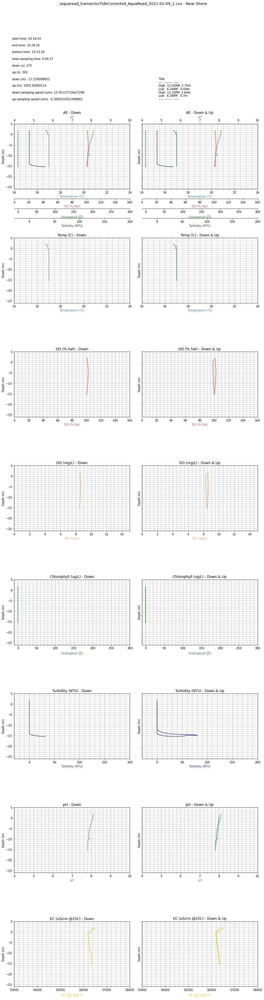

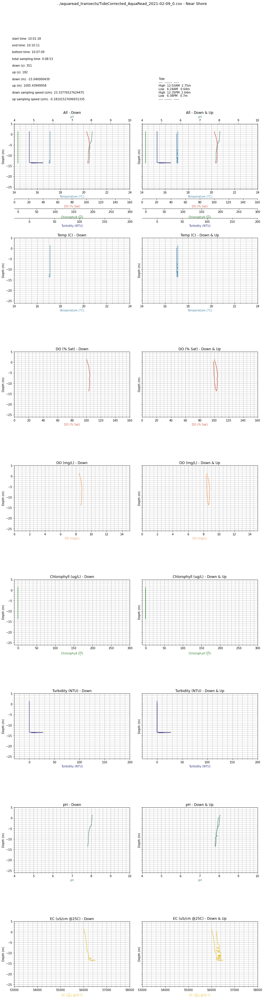

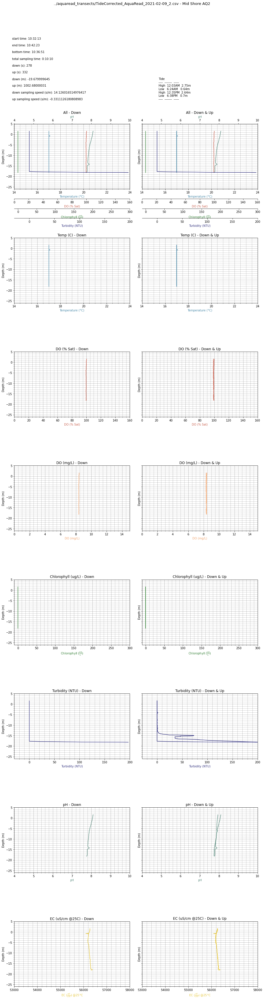

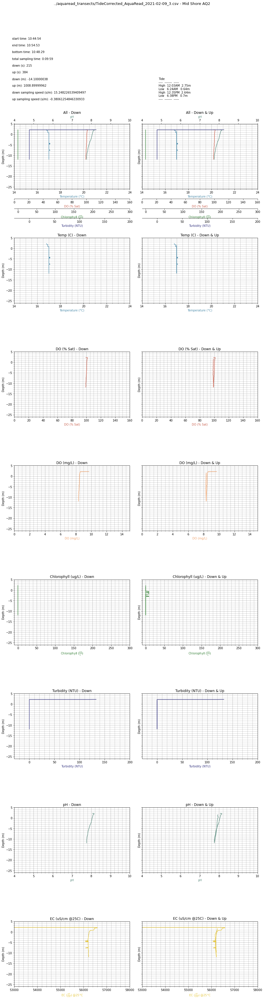

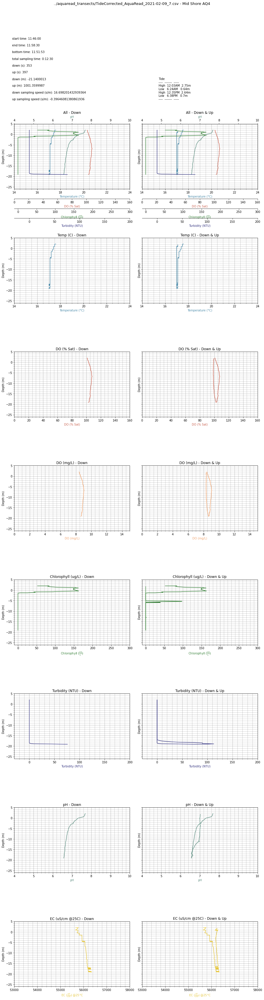

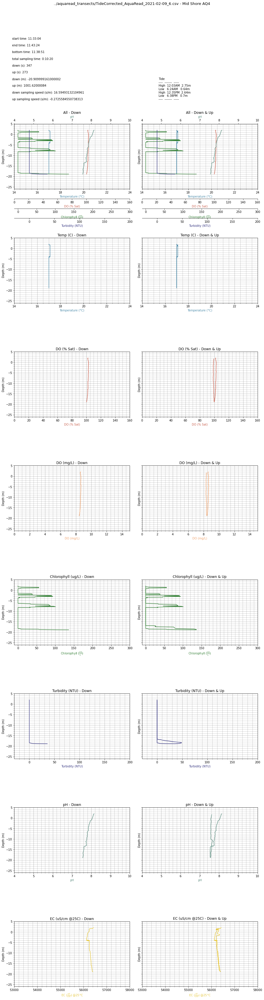

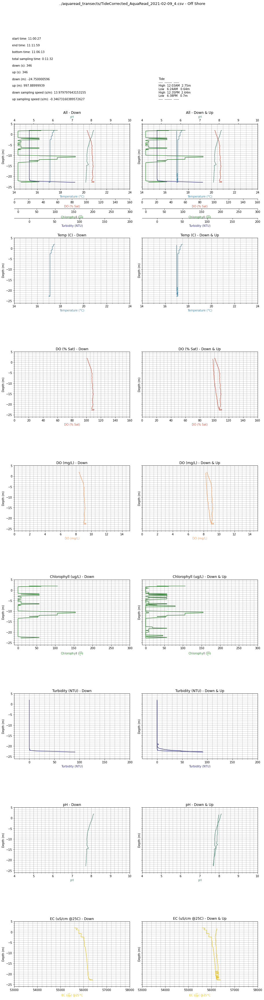

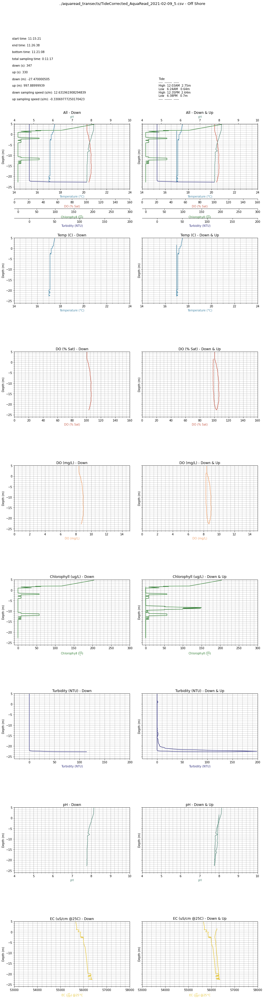

In [17]:
for i in lookup_file_list(
    "../aquaread_transects", 
    collection_date,
    tidecor=True
):
    plot_all8(i, 
              collection_date,
              old_probe=True,
              plot_export=True,
              tidecor=True
             )

In [18]:
def lookup_file_list_timedim(
    mypath, 
    collection_date_list, 
    transects,
    tidecor=False):
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    targets = []
    for i in onlyfiles:
        if tidecor==False:
            if (i[-16:-6] in collection_date_list.keys()) and (i[-5] in transects) and ('Tide' not in i) and ('calc' not in i):
                targets.append(join(mypath,i))
        else:
            if (i[-16:-6] in collection_date_list.keys()) and (i[-5] in transects) and ('Tide' in i) and ('calc' not in i):
                targets.append(join(mypath,i))
    return targets

In [19]:
list_of_files = lookup_file_list_timedim(
    "../aquaread_transects", 
    collection_date_list, 
    ['0','1'],
    tidecor=False)  

In [20]:
def timedim_plotall4(
    transects, 
    plot_export=False,
    tidecor=False
):     
    #update 2020-08-03
    
    def lookup_file_list_timedim(
        mypath, 
        collection_date_list, 
        transects,
        tidecor=False):
    
        onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
        targets = []
        for i in onlyfiles:
            if tidecor==False:
                if (i[-16:-6] in collection_date_list.keys()) and (i[-5] in transects) and ('Tide' not in i) and ('calc' not in i):
                    targets.append(join(mypath,i))
            else:
                if (i[-16:-6] in collection_date_list.keys()) and (i[-5] in transects) and ('Tide' in i) and ('calc' not in i):
                    targets.append(join(mypath,i))
        return targets

    if tidecor==False:
        list_of_files = lookup_file_list_timedim(
            "../aquaread_transects", 
            collection_date_list, 
            transects,
            tidecor=False)   
        list_of_files.sort()
        
        dlim1 = -26
        dlim2 = 0
        
    elif tidecor==True:
        list_of_files = lookup_file_list_timedim(
            "../aquaread_transects", 
            collection_date_list, 
            transects,
            tidecor=True)   
        list_of_files.sort()
        
        dlim1 = -26
        dlim2 = 5
    
    
    #create figure and subplot
    l = []
    for i in list_of_files:
        l.append(i[-16:-6])
    
    row_no = len(set(l))
    fig, axes = plt.subplots(row_no, 2, sharey=True)
    fig.set_size_inches(12.8, row_no*8)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.98)  
    if transects[0] == '0':
        fig.suptitle('AQ1 - Near Shore', x=0.5, y=0.92, fontsize=13)
    if transects[0] == '2':
        fig.suptitle('AQ2 - Mid Shore', x=0.5, y=0.92, fontsize=13)
    if transects[0] == '4':
        fig.suptitle('AQ3 - Off Shore', x=0.5, y=0.92, fontsize=13)
    if transects[0] == '6':
        fig.suptitle('AQ4 - Mid Shore', x=0.5, y=0.92, fontsize=13)
        
    #generating layout lists based on the list of files
    rows_list =list(np.arange(0,row_no,1))
    l = list(np.arange(0,row_no,1))
    for i in l:
        rows_list.append(i)
    rows_list.sort()
    cols_list =[0,1]*row_no
    
    n=0    
    for i in list_of_files:
        try:
            tr = pd.read_csv(i)

            if tidecor == False:
                depth = tr['Depth (m)']
            else:
                depth = tr['Tide Corrected Depth (m)']

            #create main axes
            if n%2==1:
                if i[-16:-6] == list_of_files[list_of_files.index(i)-1][-16:-6]:
                    pass
                else:
                    n=n+1
            
            ax1 = axes[rows_list[n], cols_list[n]]

            ax1.plot(tr['Temp (C)'], -depth, label=params_attr['Temp (C)']['label'], c=params_attr['Temp (C)']['color'])
            ax1.set_xlabel(params_attr['Temp (C)']['label'], c=params_attr['Temp (C)']['color'])
            ax1.set_ylabel('Depth (m)')
            ax1.set_ylim(dlim1,dlim2)
            ax1.set_xlim(params_attr['Temp (C)']['lim1'],params_attr['Temp (C)']['lim2'])
            ax1.set_axisbelow(True)
            ax1.grid(linestyle='-', linewidth='0.5', color='grey')
            ax1.set_axisbelow(True)
            ax1.minorticks_on()
            ax1.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
            ax1.set_title(i[-16:-6])

            #create subaxes
            def add_xaxis(pstr, how_low, ph=False):
                new_axis = ax1.twiny()
                if ph==False:
                    new_axis.xaxis.set_ticks_position("bottom")
                    new_axis.xaxis.set_label_position("bottom")
                    new_axis.spines["bottom"].set_position(("axes", how_low)) 
                else:
                    new_axis.xaxis.set_ticks_position("top")
                    new_axis.xaxis.set_label_position("top")   
                new_axis.plot(tr[pstr], -depth, color=params_attr[pstr]['color'], label=params_attr[pstr]['label'])
                new_axis.set_xlabel(params_attr[pstr]['label'], c=params_attr[pstr]['color'])
                new_axis.set_xlim(params_attr[pstr]['lim1'],params_attr[pstr]['lim2'])  

            if collection_date_list[i[-16:-6]]['probe']=='old':
                add_xaxis('DO (% Sat)',-0.15)
                add_xaxis('pH',-0.30,ph=True)           
                add_xaxis('Chlorophyll (ug/L)',-0.30)
                add_xaxis('Turbidity (NTU)',-0.45)
            else:
                add_xaxis('DO (% Sat)',-0.15)
                add_xaxis('pH',-0.30,ph=True)  
        except:
            pass
        n = n+1
    
    if plot_export==True:
        tr_dict = {
            '0':'AQ1',
            '2':'AQ2',
            '4':'AQ3',
            '6':'AQ4'}
        if tidecor==False:
            fig.savefig('{}_timeplot.png'.format(tr_dict[transects[0]]), bbox_inches='tight', dpi=200)
        elif tidecor==True:
            fig.savefig('{}_timeplot_tc.png'.format(tr_dict[transects[0]]), bbox_inches='tight', dpi=200)
    else:
        pass

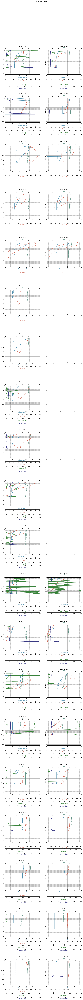

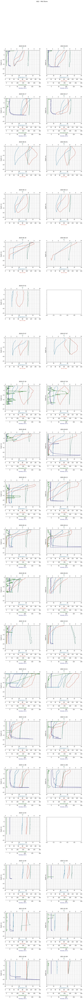

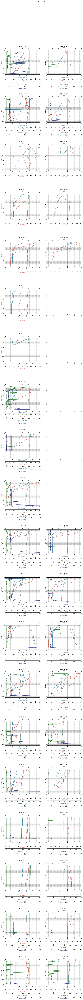

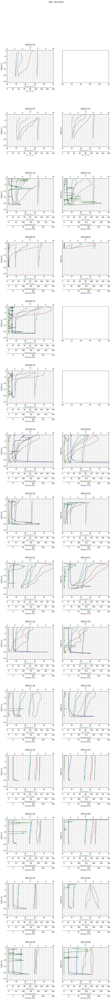

In [21]:
timedim_plotall4(
    ['0','1'], 
    plot_export=True,
    tidecor=False
)
timedim_plotall4(
    ['2','3'], 
    plot_export=True,
    tidecor=False
)
timedim_plotall4(
    ['4','5'], 
    plot_export=True,
    tidecor=False
)
timedim_plotall4(
    ['6','7'], 
    plot_export=True,
    tidecor=False
)

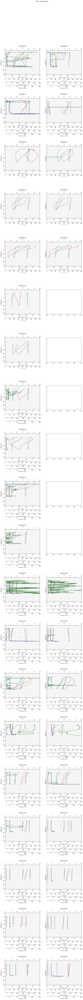

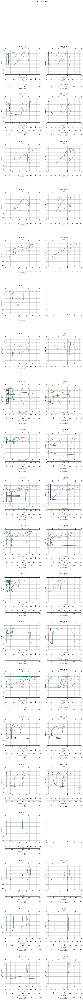

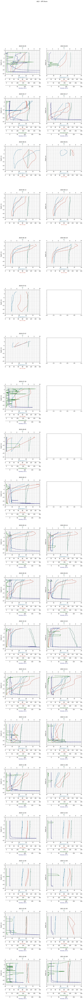

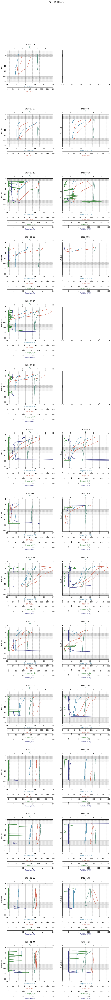

In [22]:
timedim_plotall4(
    ['0','1'], 
    plot_export=True,
    tidecor=True
)
timedim_plotall4(
    ['2','3'], 
    plot_export=True,
    tidecor=True
)
timedim_plotall4(
    ['4','5'], 
    plot_export=True,
    tidecor=True
)
timedim_plotall4(
    ['6','7'], 
    plot_export=True,
    tidecor=True
)